# Определение стоимости автомобилей

Сервис по продаже автомобилей с пробегом «Не бит, не крашен» разрабатывает приложение для привлечения новых клиентов. В нём можно быстро узнать рыночную стоимость своего автомобиля. В вашем распоряжении исторические данные: технические характеристики, комплектации и цены автомобилей. Вам нужно построить модель для определения стоимости. 

Заказчику важны:

- качество предсказания;
- скорость предсказания;
- время обучения.

## Подготовка данных

In [5]:
# импортируем библиотеку pandas
import pandas as pd
# импортируем библиотеку numpy
import numpy as np
# импортируем библиотеки math
import math
# испортируем библиотеку sklearn
import sklearn
# импортируем библиотеку plotly, с помощью которой будем строить графики
import plotly as go
import plotly.express as px

# импортируем функцию из бибилиотеки sklearn
from sklearn.model_selection import train_test_split

# импортируем StandardScaler из библиотеки sklearn
from sklearn.preprocessing import StandardScaler

# импортируем функции для кодирования признаков
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OrdinalEncoder

# импортируем библиотеку LghtGBM
import lightgbm as lgb

# добавим случайности нашей функции, чтобы каждый раз брался разный сэмпл
from numpy.random import RandomState

# импортируем метод для подобора наилучших параметров 
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

# импортируем метод линейной регрессии
from sklearn.linear_model import LinearRegression
# импортируем cross_validate из sklearn
from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_score

# импортируем функцию LabelEncoder
from sklearn.preprocessing import LabelEncoder

# импортируем метрику rmse
from sklearn.metrics import mean_squared_error

from sklearn.exceptions import ConvergenceWarning

In [6]:
# зададим RandomState
state = RandomState(12345)

# Сброс ограничений на число столбцов и строк
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

Изучим данные датасета

In [7]:
# считываем csv-файл датасета в перемнную df
try:
    df = pd.read_csv('autos.csv')
except:
    df = pd.read_csv('https://code.s3.yandex.net/datasets/autos.csv')

In [8]:
# рассмотрим данные датасета df
df.head()

,DateCrawled,Price,VehicleType,RegistrationYear,Gearbox,Power,Model,Kilometer,RegistrationMonth,FuelType,Brand,Repaired,DateCreated,NumberOfPictures,PostalCode,LastSeen
0,2016-03-24 11:52:17,480,NaN,1993,manual,0,golf,150000,0,petrol,volkswagen,NaN,2016-03-24 00:00:00,0,70435,2016-04-07 03:16:57
1,2016-03-24 10:58:45,18300,coupe,2011,manual,190,NaN,125000,5,gasoline,audi,yes,2016-03-24 00:00:00,0,66954,2016-04-07 01:46:50
2,2016-03-14 12:52:21,9800,suv,2004,auto,163,grand,125000,8,gasoline,jeep,NaN,2016-03-14 00:00:00,0,90480,2016-04-05 12:47:46
3,2016-03-17 16:54:04,1500,small,2001,manual,75,golf,150000,6,petrol,volkswagen,no,2016-03-17 00:00:00,0,91074,2016-03-17 17:40:17
4,2016-03-31 17:25:20,3600,small,2008,manual,69,fabia,90000,7,gasoline,skoda,no,2016-03-31 00:00:00,0,60437,2016-04-06 10:17:21


In [9]:
# посмотрим основную информацию по датасету df
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 354369 entries, 0 to 354368
Data columns (total 16 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   DateCrawled        354369 non-null  object
 1   Price              354369 non-null  int64 
 2   VehicleType        316879 non-null  object
 3   RegistrationYear   354369 non-null  int64 
 4   Gearbox            334536 non-null  object
 5   Power              354369 non-null  int64 
 6   Model              334664 non-null  object
 7   Kilometer          354369 non-null  int64 
 8   RegistrationMonth  354369 non-null  int64 
 9   FuelType           321474 non-null  object
 10  Brand              354369 non-null  object
 11  Repaired           283215 non-null  object
 12  DateCreated        354369 non-null  object
 13  NumberOfPictures   354369 non-null  int64 
 14  PostalCode         354369 non-null  int64 
 15  LastSeen           354369 non-null  object
dtypes: int64(7), object(

Сразу обработаем названия столбцов и приведем их к правильному стилю

In [10]:
# сразу приведем наименования столбцов к нижнему регистру
df.columns = df.columns.str.lower()

In [11]:
# поменяем названия столбцов
df.rename(columns = {'datecrawled' : 'date_crawled', 
                     'vehicletype' : 'vehicle_type', 
                     'registrationyear' : 'registration_year', 
                     'registrationmonth' : 'registration_month', 
                     'fueltype' : 'fuel_type', 
                     'datecreated' : 'date_created', 
                     'numberofpictures' : 'number_of_pictures',
                     'postalcode' : 'postal_code',
                     'lastseen' : 'last_seen'}, inplace = True)

In [12]:
# посмотрим основную информацию по датасету df
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 354369 entries, 0 to 354368
Data columns (total 16 columns):
 #   Column              Non-Null Count   Dtype 
---  ------              --------------   ----- 
 0   date_crawled        354369 non-null  object
 1   price               354369 non-null  int64 
 2   vehicle_type        316879 non-null  object
 3   registration_year   354369 non-null  int64 
 4   gearbox             334536 non-null  object
 5   power               354369 non-null  int64 
 6   model               334664 non-null  object
 7   kilometer           354369 non-null  int64 
 8   registration_month  354369 non-null  int64 
 9   fuel_type           321474 non-null  object
 10  brand               354369 non-null  object
 11  repaired            283215 non-null  object
 12  date_created        354369 non-null  object
 13  number_of_pictures  354369 non-null  int64 
 14  postal_code         354369 non-null  int64 
 15  last_seen           354369 non-null  object
dtypes:

По информации к датасету можем отметить следующее:
- всего у нас в наличии 354 369 строк, разделенных на 16 столбцов;
- обработали наименования столбцов согласно стилистики;
- в следующих столбцах имеются пропуски: `vehicle_type`, `gearbox`, `fuel_type`, `repaired`.
- ряд столбов возможно потребует корректировки типа данных. К примеру необходимо поменять тип данных в столбце `date_crawled`, `date_created`

**Описание данных**

Признаки
- date_crawled — дата скачивания анкеты из базы
- vehicle_type — тип автомобильного кузова
- registration_year — год регистрации автомобиля
- gearbox — тип коробки передач
- power — мощность (л. с.)
- model — модель автомобиля
- kilometer — пробег (км)
- registration_month — месяц регистрации автомобиля
- fuel_type — тип топлива
- brand — марка автомобиля
- repaired — была машина в ремонте или нет
- date_created — дата создания анкеты
- number_of_pictures — количество фотографий автомобиля
- postal_code — почтовый индекс владельца анкеты (пользователя)
- last_seen — дата последней активности пользователя

Целевой признак
- price — цена (евро)

In [13]:
# для визуального представления построим гистограммы для всех столбцов датасета с помощью библиотеки Plotly
for column in df.columns:
    hist = px.histogram(df, x=column, nbins=50)
    hist.show()

Произведем предобработку данных

**Выводы**

Изучив первоначальные данные можно сказать следующее:
- о каждой строке таблицы — данные об объявлениях о продаже автомобилей;
- объявления подавались в период первой половины 2016 года;
- значаительная часть автомобилей относиться к "гольф" классу;
- по типу кузова больше всего объявлений у миниавтомобилей, седанов, универсалов;
- большинство авто продается с механической коробкой передач;
- дизельных авто продается большей чем бензиновых.

## Предобработка данных

Произведем предобработку данных для последующего создания моделей. Перед этим удалим 4 столбца с датами, т.к. они не понадобятся

In [14]:
# сбросим три столбца, которые не помогут нам предсказать целевой признак
df = df.drop(['date_crawled','date_created','last_seen','registration_month', 'number_of_pictures', 'postal_code'], axis=1)

In [15]:
# посмотрим основную информацию по датасету df
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 354369 entries, 0 to 354368
Data columns (total 10 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   price              354369 non-null  int64 
 1   vehicle_type       316879 non-null  object
 2   registration_year  354369 non-null  int64 
 3   gearbox            334536 non-null  object
 4   power              354369 non-null  int64 
 5   model              334664 non-null  object
 6   kilometer          354369 non-null  int64 
 7   fuel_type          321474 non-null  object
 8   brand              354369 non-null  object
 9   repaired           283215 non-null  object
dtypes: int64(4), object(6)
memory usage: 27.0+ MB


Обработаем пропуски в датасете. Сначала рассмотрим общее количество пропусков

In [16]:
#посчитаем количество ожидаемах пропусков в каждом столбце
df.isna().sum()

price                    0
vehicle_type         37490
registration_year        0
gearbox              19833
power                    0
model                19705
kilometer                0
fuel_type            32895
brand                    0
repaired             71154
dtype: int64

Заполнение пропусков лучше всего заполнять по моде. Основными стобцами будут для этого `model`, `brand`, `power`. 
Для этого проверим наличие аномальных значений в следующих столбцах, касающихся характеристик продаж и рейтинга игр в столбцах `registration_year`, `power`, `kilometer`, `price`

In [17]:
# проверим количетство, минимальное и максимальные значения в выбранных столбцах
(
    df[['registration_year', 'power', 'kilometer', 'price']]
    .apply (['count', 'min', 'max'])   
    .style.format("{:,.2f}")
)

,registration_year,power,kilometer,price
count,"354,369.00","354,369.00","354,369.00","354,369.00"
min,"1,000.00",0.00,"5,000.00",0.00
max,"9,999.00","20,000.00","150,000.00","20,000.00"


Видим наличие аномальных значений в столбцах `registration_year`, `power`, `price`. Сначала рассмотрим столбец `registration_year`

In [18]:
# посмтрим с помощью функции describe() данные по значениям
df['registration_year'].describe()

count    354369.000000
mean       2004.234448
std          90.227958
min        1000.000000
25%        1999.000000
50%        2003.000000
75%        2008.000000
max        9999.000000
Name: registration_year, dtype: float64

In [19]:
# рассмотрим уникальные значения с помощью функции unique()
df['registration_year'].sort_values().unique()

array([1000, 1001, 1039, 1111, 1200, 1234, 1253, 1255, 1300, 1400, 1500,
       1600, 1602, 1688, 1800, 1910, 1915, 1919, 1920, 1923, 1925, 1927,
       1928, 1929, 1930, 1931, 1932, 1933, 1934, 1935, 1936, 1937, 1938,
       1940, 1941, 1942, 1943, 1944, 1945, 1946, 1947, 1948, 1949, 1950,
       1951, 1952, 1953, 1954, 1955, 1956, 1957, 1958, 1959, 1960, 1961,
       1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969, 1970, 1971, 1972,
       1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983,
       1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994,
       1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005,
       2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016,
       2017, 2018, 2019, 2066, 2200, 2222, 2290, 2500, 2800, 2900, 3000,
       3200, 3500, 3700, 3800, 4000, 4100, 4500, 4800, 5000, 5300, 5555,
       5600, 5900, 5911, 6000, 6500, 7000, 7100, 7500, 7800, 8000, 8200,
       8455, 8500, 8888, 9000, 9229, 9450, 9996, 99

Аномальные значения по столбцу `registration_year` удалим. Оставим объявления с годом регистрации автомобилей с 1970 по 2017 года

In [20]:
# исключим аномальные значения страше 1970 года и позднее 2017 года
df = df[(df['registration_year'] > 1970) & (df['registration_year'] < 2017)]

In [21]:
# рассмотрим уникальные значения с помощью функции unique()
df['registration_year'].sort_values().unique()

array([1971, 1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981,
       1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992,
       1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003,
       2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014,
       2015, 2016], dtype=int64)

Теперь рассмотрим аномальные значения по столбцу `power`

In [22]:
# посмтрим с помощью функции describe() данные по значениям
df['power'].describe()

count    338168.000000
mean        111.217185
std         185.151538
min           0.000000
25%          69.000000
50%         105.000000
75%         143.000000
max       20000.000000
Name: power, dtype: float64

In [23]:
# рассмотрим уникальные значения с помощью функции unique()
df['power'].sort_values().unique()

array([    0,     1,     2,     3,     4,     5,     6,     7,     8,
           9,    10,    11,    12,    13,    14,    15,    16,    17,
          18,    19,    20,    21,    22,    23,    24,    25,    26,
          27,    28,    29,    30,    31,    32,    33,    34,    35,
          36,    37,    38,    39,    40,    41,    42,    43,    44,
          45,    46,    47,    48,    49,    50,    51,    52,    53,
          54,    55,    56,    57,    58,    59,    60,    61,    62,
          63,    64,    65,    66,    67,    68,    69,    70,    71,
          72,    73,    74,    75,    76,    77,    78,    79,    80,
          81,    82,    83,    84,    85,    86,    87,    88,    89,
          90,    91,    92,    93,    94,    95,    96,    97,    98,
          99,   100,   101,   102,   103,   104,   105,   106,   107,
         108,   109,   110,   111,   112,   113,   114,   115,   116,
         117,   118,   119,   120,   121,   122,   123,   124,   125,
         126,   127,

In [24]:
# исключим аномальные значения больше 500 л.с. и меньше 10 л.с.
df = df[(df['power'] > 10) & (df['power'] < 500)]

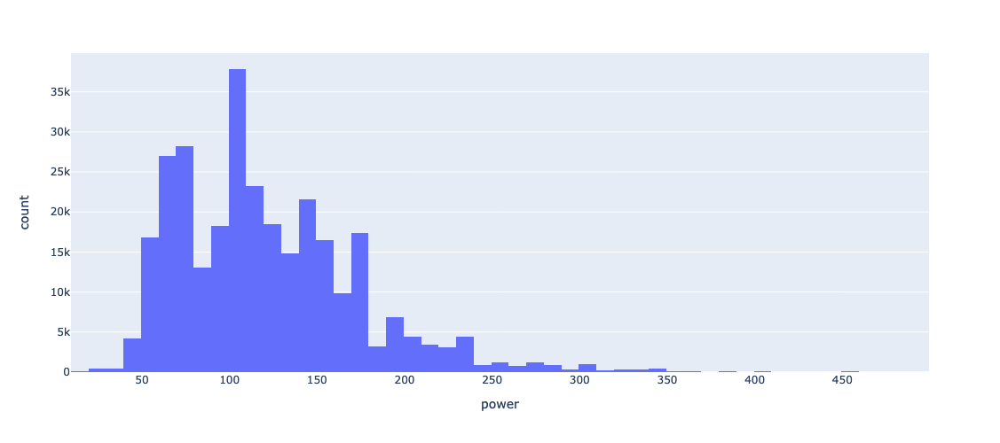

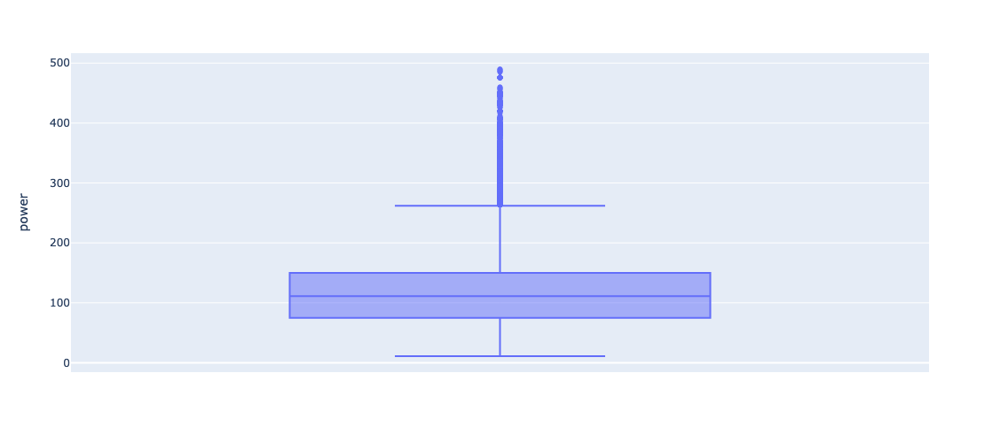

count    301753.000000
mean        120.505589
std          53.220594
min          11.000000
25%          75.000000
50%         111.000000
75%         150.000000
max         490.000000
Name: power, dtype: float64

In [25]:
# Посторим еще раз гистрограмму и диаграмму размаха для мощности
hist = px.histogram(df, x='power', nbins=50)
hist.update_layout(height=500)
hist.show()
fig = px.box(df, y='power')
fig.update_layout(height=500)
fig.show()
# применим describe() к изучаемым данным
df['power'].describe()

Теперь рассмотрим аномальные значения по столбцу `price`

In [26]:
# посмтрим с помощью функции describe() данные по значениям
df['price'].describe()

count    301753.000000
mean       4739.352338
std        4605.354007
min           0.000000
25%        1250.000000
50%        3000.000000
75%        6900.000000
max       20000.000000
Name: price, dtype: float64

In [27]:
#посмотрим количество нулевых значений
df[df['price'] == 0].count()

price                6346
vehicle_type         5383
registration_year    6346
gearbox              5980
power                6346
model                5549
kilometer            6346
fuel_type            5186
brand                6346
repaired             4031
dtype: int64

In [28]:
# исключим аномальные значения с нулевой ценой
df = df[(df['price'] != 0)]

Обработав аномальные значения мы получили нормальное распределение.

Теперь можно обработать пропуски. Начнем со столбца `model`. В нем пропуски можно заполнить по моде в связке со столбцами `brand` и `power`

In [29]:
#посчитаем количество ожидаемах пропусков в каждом столбце
df.isna().sum()

price                    0
vehicle_type         10971
registration_year        0
gearbox               5321
power                    0
model                10799
kilometer                0
fuel_type            15463
brand                    0
repaired             42692
dtype: int64

In [30]:
# применим функцию transform, mode для заполнения пропусков в столбце model
df['model'] = (df.groupby
               (['brand','power'])['model'].
               transform(lambda x: x.fillna
                         (x.mode()[0] if not x.mode().empty else 'unknown')))

Далее можно обработать пропуски в столбцах `vehicle_type`, `fuel_type` и `gearbox`. В них пропуски можно заполнить по моде в связке со столбцами `brand`, `power` и `model`

In [31]:
# применим функцию transform, mode для заполнения пропусков в столбце vehicle_type
df['vehicle_type'] = (df.groupby
                      (['brand','power', 'model'])['vehicle_type'].
                      transform(lambda x: x.fillna
                                (x.mode()[0] if not x.mode().empty else 'unknown')))

In [32]:
# применим функцию transform, mode для заполнения пропусков в столбце fuel_type
df['fuel_type'] = (df.groupby
                   (['brand','power', 'model'])['fuel_type'].
                   transform(lambda x: x.fillna
                             (x.mode()[0] if not x.mode().empty else 'unknown')))

In [33]:
# применим функцию transform, mode для заполнения пропусков в столбце gearbox
df['gearbox'] = (df.groupby
                 (['brand','power', 'model'])['gearbox'].
                 transform(lambda x: x.fillna
                           (x.mode()[0] if not x.mode().empty else 'unknown')))

Значения в столбце `repaired` состоит из значений `yes` или `no`. Для заполнения пропусков применим третье значение `unknown`

In [34]:
# заполним пропуски в столбце 'repaired' значением 'unknown'
df['repaired'] = df['repaired'].fillna('unknown')

In [35]:
#посчитаем количество ожидаемах пропусков в каждом столбце
df.isna().sum()

price                0
vehicle_type         0
registration_year    0
gearbox              0
power                0
model                0
kilometer            0
fuel_type            0
brand                0
repaired             0
dtype: int64

Посмотрим наличие явных дубликатов в датасете:

In [36]:
# выведем количество дубликатов в датасете
display(df.duplicated().sum())

42755

**Выводы**

По результатам, проведенной предобработки данных:
- в датасете присутствовали аномальные данные в столбцах `registration_year`, `power`, `price`. Отфильтровали датасет исключив аномальные значения;
- в столбце `model` пропуски заполнили по моде в зависимости от значений в столбцах `brand`, `power`;
- в столбцах `vehicle_type`, `gearbox`, `fuel_type` пропуски заполнили по моде в зависимости от значений в столбцах `brand`, `power` и `model`;
- в столбце `repaired` пропуски заполнили третьим значением `unknown`;
- в датасете присутствуют явные дубликаты в количестве 21,7 тыс. Но мы считаем, что это вполне нормально для объявлений о продаже автомобилей. Многие объявления могут создаваться на основе существующих объявлений.

## Обучение моделей

Выделим из полученного датасета признаки и целевые признаки. Далее разделим на тестовую и обучающую выборки в соотношении 1:3.  Все категориальные признаки закодируем с помощью OHE

In [37]:
# выделим признаки и целевой признак
target = df['price']
features = df.drop('price', axis=1)
# разделим данные на тестовую и обучающую выборки
features_train, features_test, target_train, target_test = train_test_split(features, target, test_size=0.33, random_state=state)

In [44]:
# создаем список категориальных колонок cat_columns и числовых numeric
cat_columns = ['vehicle_type', 'gearbox', 'model', 'fuel_type', 'brand', 'repaired']
numeric = ['power', 'kilometer', 'registration_year']

Применим для выборок, которые будем применять на моделях бустинга только порядковое кодирование, а для линейной модели применим еще масштабирование

In [47]:
# создадим метод ohe_enc для кодирования
ordinal = OrdinalEncoder()
ordinal.fit(features_train[cat_columns])
# создаем обучающую выборку с закодированными данными
features_train_ord = pd.DataFrame(ordinal.transform(features_train[cat_columns]), 
                            columns = cat_columns, index = features_train.index)
# объединяем таблицы
features_train_ord = features_train_ord.join(features_train[numeric]) 

In [52]:
features_train_ord.head()

,vehicle_type,gearbox,model,fuel_type,brand,repaired,power,kilometer,registration_year
224863,4.0,1.0,116.0,6.0,38.0,1.0,75,150000,1993
30805,4.0,1.0,51.0,6.0,38.0,0.0,116,80000,1999
278412,0.0,1.0,237.0,2.0,20.0,0.0,88,150000,2005
118057,4.0,1.0,11.0,6.0,2.0,0.0,118,150000,1998
275184,4.0,1.0,116.0,6.0,38.0,0.0,75,150000,2006


In [51]:
features_train_ord.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 197922 entries, 224863 to 260929
Data columns (total 9 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   vehicle_type       197922 non-null  float64
 1   gearbox            197922 non-null  float64
 2   model              197922 non-null  float64
 3   fuel_type          197922 non-null  float64
 4   brand              197922 non-null  float64
 5   repaired           197922 non-null  float64
 6   power              197922 non-null  int64  
 7   kilometer          197922 non-null  int64  
 8   registration_year  197922 non-null  int64  
dtypes: float64(6), int64(3)
memory usage: 19.1 MB


In [50]:
# создаем обучающую выборку с закодированными данными
features_test_ord = pd.DataFrame(ordinal.transform(features_test[cat_columns]), 
                            columns = cat_columns, index = features_test.index)
# объединяем таблицы
features_test_ord = features_test_ord.join(features_test[numeric]) 

In [54]:
features_test_ord.head()

,vehicle_type,gearbox,model,fuel_type,brand,repaired,power,kilometer,registration_year
68365,5.0,1.0,102.0,4.0,10.0,1.0,120,150000,2009
40698,1.0,1.0,10.0,6.0,25.0,0.0,120,80000,2010
13829,8.0,0.0,31.0,2.0,1.0,0.0,150,150000,1998
280654,4.0,1.0,116.0,6.0,38.0,0.0,150,150000,1998
203910,4.0,1.0,29.0,2.0,1.0,1.0,150,150000,2000


In [55]:
features_test_ord.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 97485 entries, 68365 to 118483
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   vehicle_type       97485 non-null  float64
 1   gearbox            97485 non-null  float64
 2   model              97485 non-null  float64
 3   fuel_type          97485 non-null  float64
 4   brand              97485 non-null  float64
 5   repaired           97485 non-null  float64
 6   power              97485 non-null  int64  
 7   kilometer          97485 non-null  int64  
 8   registration_year  97485 non-null  int64  
dtypes: float64(6), int64(3)
memory usage: 9.5 MB


Теперь для линейной модели сделаем кодирование OHE и масштабирование

In [57]:
# создадим метод column_transformer который закодирует категориальные признаки и масштабирует числовые признаки
column_transformer = make_column_transformer((OneHotEncoder(drop='first', handle_unknown='ignore'),cat_columns),
    (StandardScaler(), numeric),
    remainder='passthrough',
    verbose_feature_names_out=False
)

In [58]:
# преобразуем признаки тестовой и обучающей выборок
features_train_scl = column_transformer.fit_transform(features_train)
features_test_scl = column_transformer.transform(features_test)

In [59]:
features_train_scl

<197922x310 sparse matrix of type '<class 'numpy.float64'>'
	with 1571346 stored elements in Compressed Sparse Row format>

In [60]:
features_test_scl

<97485x310 sparse matrix of type '<class 'numpy.float64'>'
	with 773757 stored elements in Compressed Sparse Row format>

Теперь приступим к обчуению моделей с помощью библиотеки LightGBM.

Информацию о библиотеке взял с этих ресурсов: https://habr.com/ru/company/skillfactory/blog/530594/ , https://pythonru.com/biblioteki/lightgbm

In [61]:
# посомтрим версию библиотеки LightGBM
print(lgb.__version__)

3.3.3


Начнем с модели дерева принятия решений с градиентным бустингом (gbdt: traditional Gradient Boosting Decision Tree). 

In [62]:
%%time
# с помощью GridSearchCV подберем параметры для модели
# создадим модель gbdt
lgb_model = lgb.LGBMRegressor(random_state = state)
# определим параметры 
parameters = {
    'task' : ['train'],
    'boosting': ['gbdt'],
    'objective': ['root_mean_squared_error'],
    'num_iterations': [1500, 2000],
    'learning_rate':[0.05, 0.01],
    'num_leaves':[7, 15],
    'max_depth' :[10, 15],
    'min_data_in_leaf':[15, 25],
    'metric': ['rmse']
     }
gsearch_lgb = GridSearchCV(lgb_model, param_grid = parameters, cv=3) 
# обучим модель
gsearch_lgb.fit(features_train_ord,target_train) 

C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15
CPU times: total: 1h 19min 5s
Wall time: 3min 27s


GridSearchCV(cv=3,
             estimator=LGBMRegressor(random_state=RandomState(MT19937) at 0x1DAFD37E840),
             param_grid={'boosting': ['gbdt'], 'learning_rate': [0.05, 0.01],
                         'max_depth': [10, 15], 'metric': ['rmse'],
                         'min_data_in_leaf': [15, 25],
                         'num_iterations': [1500, 2000], 'num_leaves': [7, 15],
                         'objective': ['root_mean_squared_error'],
                         'task': ['train']})

In [63]:
# посмотрим подобранные параметры 
print('best params')
print(gsearch_lgb.best_params_)

best params
{'boosting': 'gbdt', 'learning_rate': 0.05, 'max_depth': 10, 'metric': 'rmse', 'min_data_in_leaf': 15, 'num_iterations': 2000, 'num_leaves': 15, 'objective': 'root_mean_squared_error', 'task': 'train'}


Используя подобранные параметры посмотрим как быстро будет обучаться модель

In [64]:
%%time
# определим гиперпараметры
boosting_type = 'gbdt'
task = 'train'
objective = 'root_mean_squared_error'
num_iterations = 2000
max_depth = 10
num_leaves = 15
learning_rate = 0.05
metric = 'rmse'
min_data_in_leaf = 15
param_dist = {'boosting_type': boosting_type,
              'task': task,
              'num_iterations': num_iterations,
              'objective': objective,
              'max_depth': max_depth,
              'num_leaves': num_leaves,
              'learning_rate': learning_rate,
              'metric': metric,
              'objective': objective,
              'min_data_in_leaf': min_data_in_leaf
             }
# создадим модель
model_gbdt = lgb.LGBMRegressor(**param_dist)
# обучим модель
model_gbdt.fit(features_train_ord,target_train,
               eval_set=[(features_train_ord,target_train)],
               eval_metric='rmse',
               early_stopping_rounds=10, 
               verbose = 1000,
               )

C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[1000]	training's rmse: 1543.43
[2000]	training's rmse: 1463.54
CPU times: total: 1min 4s
Wall time: 2.8 s


LGBMRegressor(learning_rate=0.05, max_depth=10, metric='rmse',
              min_data_in_leaf=15, num_iterations=2000, num_leaves=15,
              objective='root_mean_squared_error', task='train')

In [65]:
%%time
# определим значение rmse на обучающей выборке
rmse_gbdt = abs(cross_val_score(model_gbdt, features_train_ord, target_train, scoring = 'neg_root_mean_squared_error').mean())
print(" RMSE: %f" % (rmse_gbdt))

C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15
 RMSE: 1566.677577
CPU times: total: 4min 55s
Wall time: 12.7 s


In [66]:
%%time
# определим время предсказания модели
preds_gbdt_model = model_gbdt.predict(features_train_ord)

CPU times: total: 18 s
Wall time: 794 ms


<div class="alert alert-danger">
<b>🚫 Комментарий ревьювера v4:</b> Необходимо поправить расчет метрики RMSE на кросс-валидации. Дело в том, что модель уже видела выборку train, т.к. по ней обучалась, поэтому результаты будут слишком оптимистичные.
    
Поскольку ты использовал GridSearchCV, то лучший результат на кросс-валидации по выборке train можно посмотреть таким образом:
    
    gsearch_lgb.best_score_
    
Если в модели не использовалась GridSearchCV, то нужно применить функцию cross_val_score:
    
    best_score = cross_val_score(best_model, X_train, y_train, scoring = 'neg_root_mean_squared_error').mean()
    
https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.cross_val_score.html
    
</div>

Минимальный показатель RMSE получили на уровне 1565 при времени обучения 1 мин. 4 сек и времени предсказания 18 сек.

Теперь попробуем Dropouts meet Multiple Additive Regression Trees. Это Dropout на множественных аддитивных регрессионных деревьях. Добавим 2 параметра, а остальные гиперпараметры оставим без изменений

In [67]:
%%time
# определим гиперпараметры
boosting_type = 'dart'
task = 'train'
objective = 'root_mean_squared_error'
num_iterations = 2000
max_depth = 10
num_leaves = 15
learning_rate = 0.05
metric = 'rmse'
min_data_in_leaf = 15
param_dist = {'boosting_type': boosting_type,
              'task': task,
              'num_iterations': num_iterations,
              'max_depth': max_depth,
              'num_leaves': num_leaves,
              'learning_rate': learning_rate,
              'metric': metric,
              'objective': objective,
              'min_data_in_leaf': min_data_in_leaf
             }
# создадим модель
model_dart = lgb.LGBMRegressor(**param_dist)
# обучим модель
model_dart.fit(features_train_ord, target_train,
               eval_set=[(features_train_ord, target_train)],
               eval_metric='rmse',
               early_stopping_rounds=10, 
               verbose = 1000,
               )

C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\callback.py:223: UserWarning:

Early stopping is not available in dart mode



[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15
[1000]	training's rmse: 1705.19
[2000]	training's rmse: 1618.65
CPU times: total: 16min 6s
Wall time: 45.4 s


LGBMRegressor(boosting_type='dart', learning_rate=0.05, max_depth=10,
              metric='rmse', min_data_in_leaf=15, num_iterations=2000,
              num_leaves=15, objective='root_mean_squared_error', task='train')

In [68]:
%%time
# определим значение rmse на обучающей выборке
rmse_dart = abs(cross_val_score(model_dart, features_train_ord, target_train, scoring = 'neg_root_mean_squared_error').mean())
print(" RMSE: %f" % (rmse_dart))

C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15
 RMSE: 1650.789868
CPU times: total: 57min 13s
Wall time: 2min 29s


In [69]:
%%time
# определим время предсказания модели
preds_dart_model = model_dart.predict(features_train_ord)

CPU times: total: 21.8 s
Wall time: 985 ms


Минимальный показатель RMSE получили на уровне 1651 при времени обучения 16 мин. 6 сек. и времени предсказания 21 сек.

Еще используем модель односторонней выборки на основе градиента GOSS

In [70]:
%%time
# определим гиперпараметры
boosting_type = 'goss'
task = 'train'
objective = 'root_mean_squared_error'
num_iterations = 2000
max_depth = 10
num_leaves = 15
learning_rate = 0.05
metric = 'rmse'
min_data_in_leaf = 15
param_dist = {'boosting_type': boosting_type,
              'task': task,
              'objective': objective,
              'num_iterations': num_iterations,
              'max_depth': max_depth,
              'num_leaves': num_leaves,
              'learning_rate': learning_rate,
              'metric': metric,
              'min_data_in_leaf': min_data_in_leaf
             }
# создадим модель
model_goss = lgb.LGBMRegressor(**param_dist)
# обучим модель
model_goss.fit(features_train_ord, target_train,
               eval_set=[(features_train_ord, target_train)],
               eval_metric='rmse',
               early_stopping_rounds=10, 
               verbose = 1000,
               )

C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15
[1000]	training's rmse: 1534.36
[2000]	training's rmse: 1456.8
CPU times: total: 1min 35s
Wall time: 4.13 s


LGBMRegressor(boosting_type='goss', learning_rate=0.05, max_depth=10,
              metric='rmse', min_data_in_leaf=15, num_iterations=2000,
              num_leaves=15, objective='root_mean_squared_error', task='train')

In [71]:
%%time
# определим значение rmse на обучающей выборке
rmse_goss = abs(cross_val_score(model_goss, features_train_ord, target_train, scoring = 'neg_root_mean_squared_error').mean())
print(" RMSE: %f" % (rmse_goss))

C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15
 RMSE: 1556.146688
CPU times: total: 7min 9s
Wall time: 20.2 s


In [73]:
%%time
# определим время предсказания модели
preds_goss_model = model_goss.predict(features_train_ord)

CPU times: total: 19.9 s
Wall time: 877 ms


Минимальный показатель RMSE получили на уровне 1556 при времени обучения 1 мин. 35 сек. и времени предсказания 19 сек.

Также обучим модель линейной регрессии для сравнения полученных показателей. Для этого произведем порядковое кодирование признаков и масштабируем их.

<div class="alert alert-danger">
<b>🚫 Комментарий ревьювера:</b> К сожалению, для линейных моделей не подходит порядковое кодирование OrdinalEncoder, т.к. линейная модель видит в таких признаках вектора, что приводит к неправильному обучению модели.
    
Для линейных моделей нужно применить кодирование One-hot-encoding: инструменты get_dummies(), OneHotEncoder()
    
https://pandas.pydata.org/docs/reference/api/pandas.get_dummies.html
    
https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.OneHotEncoder.html
    

</div>

In [74]:
%%time
# создадим модель линейной регрессии
model_lr = LinearRegression()
# оценим метрику sMAPE путем кросс-валидации с помощью функции cross_validate
model_lr.fit(features_train_scl, target_train)

CPU times: total: 34.3 s
Wall time: 2.95 s


LinearRegression()

In [75]:
%%time
# определим значение rmse на обучающей выборке
rmse_lr = abs(cross_val_score(model_lr, features_train_scl, target_train, scoring = 'neg_root_mean_squared_error').mean())
print(" RMSE: %f" % (rmse_lr))

 RMSE: 2544.861891
CPU times: total: 2min 41s
Wall time: 13.6 s


In [76]:
%%time
# определим время предсказания модели
preds_goss_model = model_lr.predict(features_train_scl)

CPU times: total: 0 ns
Wall time: 5 ms


Посмотрим на результаты обучения и предсказания на обучающей выборке

In [77]:
results = {'model': ['lr', 'gbdt','dart','goss'], 
           'rmse': [rmse_lr, rmse_gbdt, rmse_dart, rmse_goss],
           'train_time': ['0:34','1:04','16:06','1:35'],
           'pred_time': ['0','0:18','00:21','00:19'],
          }
results = pd.DataFrame(data=results)
results

,model,rmse,train_time,pred_time
0,lr,2544.861891,0:34,0
1,gbdt,1566.677577,1:04,0:18
2,dart,1650.789868,16:06,00:21
3,goss,1556.146688,1:35,00:19


**Вывод**

По результатам обучения моделей с помощью библиотеки LightGBM можно сказать следущее:
- при применении разных алгоритмов обучения моделей (gbdt, dart, goss) мы получили показатели RMSE на одном уровне при применении кроссвалидации.;
- наименьший показатель RMSE получен у модели с алгоритмом GOSS - 1556, а наибольший у модели LR - 2545;
- наименьшее время обучения у модели LR - 34 сек., а наимбольшее время обучения у модели DART - 16 мин.;
- наибольшее время предсказания у модели DART - 21 сек., а наименьшее у моделей LR - 0 сек.

Заказчику лучше всего рекомендовать применение модели GOSS, у которой приемлимый RMSE (1556) и низкие время обучения и время предсказания (1.5 мин. 19 сек. соотвественно)

## Анализ моделей

Теперь проверим лучшую модель, в нашем случае GBDT, на тестовой выборке

In [78]:
%%time
# определим значение rmse на обучающей выборке
rmse_test = abs(cross_val_score(model_goss, features_test_ord, target_test, scoring = 'neg_root_mean_squared_error').mean())
print(" RMSE: %f" % (rmse_test))

C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15


C:\Users\vambu\anaconda3\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15
 RMSE: 1589.273487
CPU times: total: 4min 47s
Wall time: 13.3 s


In [79]:
%%time
# определим время предсказания модели
preds_goss_model = model_goss.predict(features_test_ord)

CPU times: total: 9.77 s
Wall time: 430 ms


**Вывод**

По результатам проверки обученных моделей на тестовой выборке можно сказать следущее:
- показатель RMSE получен на уровне 1589, что соответствует требованиям заказчика;
- время предсказания составило 10 сек.

## **Выводы**

В процессе написания проекта сделано следующее:

- Произведено изучение датасета и первоначальный анализ данных;
- Проведена предобработка датасета в части заполнения пропусков и удаления столбцов, которые не понадобились при создании моделей машинного обучения. Также обработаны аномальные значения в нескольких столцах;
- Проведено кодирование признаков
- Данные были разделены на тестовую и обучающую выборки;
- Применив библиотеку LightGBM использовали алгоритмы дерева решений с градиентным бустингом (gbdt), Dropout на множественных аддитивных регрессионных деревьях (dart), односторонних выборок на основе градиента (goss), для обучения моделей. Также обучили модель линейной регрессии;
- Из рассматриваемых алгоритмов LightGBM быстрее обучалась GBDT (1 мин.). Наилучший показатель RMSE у модели GOSS - 1556;
- Медленее всего обучалась модель DART (16 мин.), а худший показатель RMSE был получен у модели линейной регрессии - 2545;
- Для тестовой выборки выбрали модель GOSS. RMSE получили на уровне 1589 при времени предсказания 10 сек.

По итогу можно рекомендовать применение модели с алгоритмом GOSS при использовании библиотеки LightGBM.